## Project 12

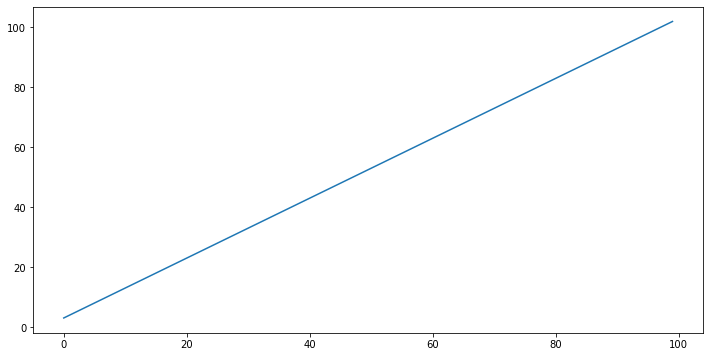

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
##lineAndRandomPoints
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

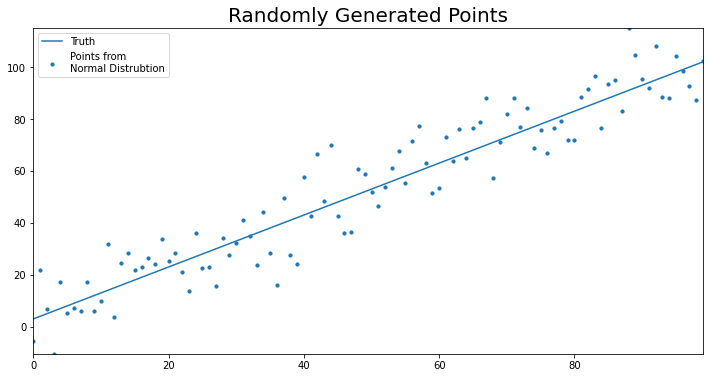

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distrubtion")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

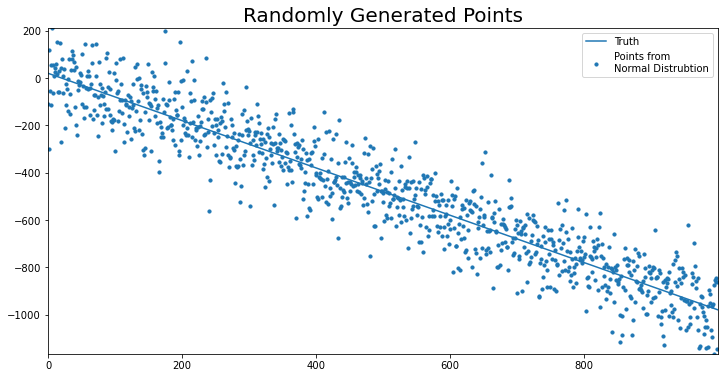

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distrubtion")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

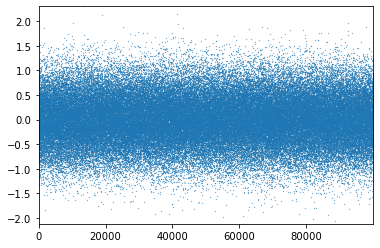

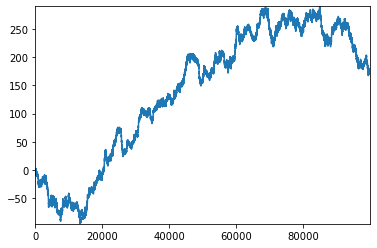

In [4]:
#montecarloSimulation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0
#SD is sigma, variance is sigma**2
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, ls = "",linewidth = 1, marker =".", markersize = .5)
plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()



In [5]:
def run_monte_carlo(mean, sigma, num_sims, sim_dict, index):
    
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)

In [6]:
mean =0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
index = np.arange(2000)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.893921,-1.663385,-0.402987,-0.200850,0.391094,0.504608,-0.739476,0.441949,-0.616097,0.253327,...,0.401004,-0.813461,-0.659048,1.112151,-1.539366,-0.396435,2.179656,-0.437377,-0.835655,-0.374467
1,-0.740043,0.665156,0.761516,1.543897,0.699005,-1.083590,-0.514882,0.653622,0.212087,0.587160,...,1.463007,0.505212,1.732655,-0.712020,0.525283,0.475487,-1.420498,-1.370233,0.045495,-0.653167
2,-0.112107,0.578675,2.333590,-1.385655,-0.411224,1.660256,-0.926680,-0.719251,0.218486,0.842973,...,0.862595,-0.024002,-0.604426,0.267333,1.048052,-0.053465,-0.471376,-1.655344,0.627902,-1.357726
3,-0.144078,0.123908,0.042596,-0.616613,-1.064536,-0.343039,-1.481319,-0.887529,0.244353,0.717708,...,-1.107105,-0.822327,1.755968,-0.763649,-1.438659,0.243247,0.903399,-0.662664,-0.046105,-0.184830
4,0.436066,-1.511169,1.542322,-0.085298,-0.698966,-0.581299,-1.063778,-0.818295,-1.172268,-2.034373,...,-2.540037,-0.547484,-0.621914,0.273201,-0.513329,-0.827239,-0.356252,-0.788947,-0.870175,0.621562
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.292115,1.911161,0.117368,0.629281,2.537371,0.295351,0.970880,1.546413,0.565028,-0.746900,...,0.120605,-0.529880,-0.391664,1.310802,1.862152,-0.901060,-0.584041,1.514574,-1.461370,-1.261592
1996,-0.390834,-0.275863,0.495284,-1.020314,1.561966,-0.164694,-0.313447,-1.227809,1.799765,-0.749424,...,-0.323004,-0.009470,-0.174386,-1.099727,1.240934,0.293429,-1.705854,0.744809,-1.103859,0.205617
1997,-0.343097,-1.084205,-0.389925,0.063670,0.078062,-1.454752,1.963890,-1.305306,-0.632484,-0.577987,...,0.453306,1.300812,-2.087497,1.598133,0.446766,-0.881100,0.210726,-2.027551,-1.644653,-0.491864
1998,-0.307456,-0.725510,-0.707175,0.824233,1.047985,1.232444,-0.378575,0.380008,-0.247058,0.677431,...,-2.108398,1.088893,0.835610,0.050656,-2.273533,1.713783,0.531788,0.095561,0.354970,-0.305731


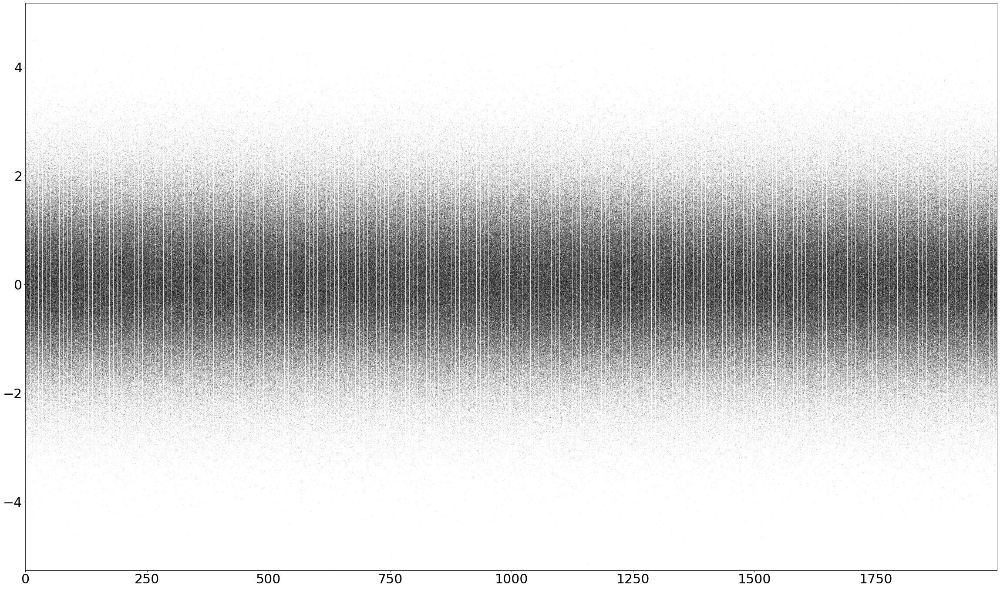

In [7]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, ls = " ", marker=".", markersize = .2, 
                            color ="k", alpha = .5, ax = ax)

plt.show()


C:\Users\SAND8464\AppData\Local\Temp/ipykernel_17584/667913757.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])


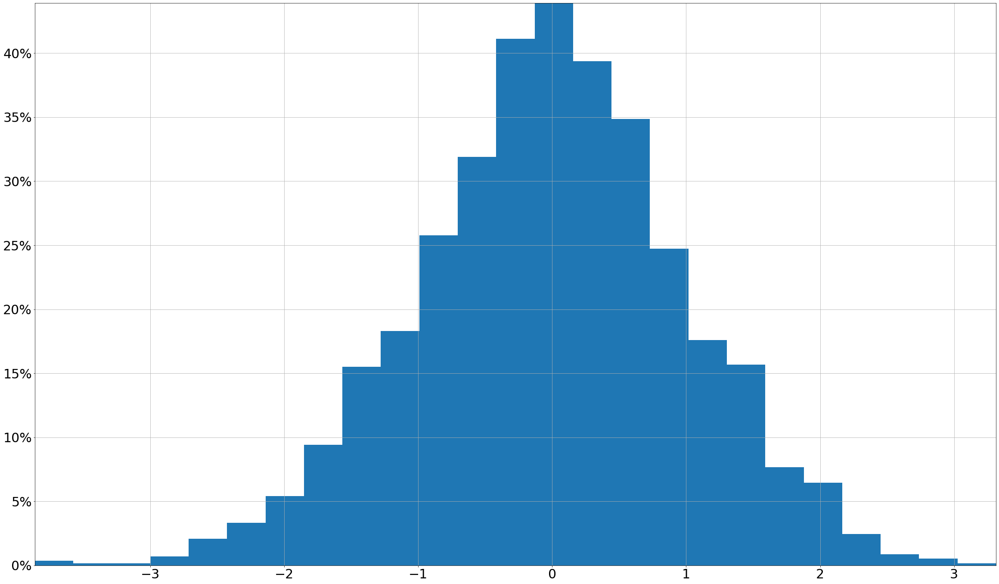

In [8]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, density = True,
                                ax = ax)

# set vertical axis values as percent
y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])
plt.show()
plt.close()

In [9]:
mean = .05
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 2000
index = np.arange(periods)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)

monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.153698,-0.455170,-1.070853,-0.010321,0.018698,0.822723,-0.455097,0.143345,0.710227,0.699590,...,-0.408447,0.777567,0.238613,0.961926,0.591834,0.300642,-0.007857,1.017920,0.220957,-0.224306
1,-0.087781,-0.337998,-1.966403,0.537861,0.105391,0.344575,-0.029118,-0.042964,0.249656,0.530454,...,-0.989109,-0.011024,-0.355601,0.758980,0.478506,-0.446357,0.064672,1.519464,0.995505,-0.281205
2,-0.059318,-0.684519,-1.606225,-0.062303,-0.105386,0.903558,1.263543,0.381468,0.179145,0.728439,...,-1.067458,1.063018,0.315820,1.144656,1.177982,-0.683776,-0.410721,1.058462,1.838024,-1.095396
3,0.064485,-0.938763,-1.592709,-0.325935,0.670474,0.312331,2.767991,1.240787,0.645886,0.318916,...,-0.587072,1.835574,0.327959,0.458579,2.246808,-0.161043,-0.404501,1.016356,2.216875,-0.967083
4,0.395710,-0.872604,-1.127220,-0.834575,0.765824,-0.441528,2.935558,1.413944,0.499883,0.167208,...,-0.165580,1.217890,-0.013551,0.506366,1.920590,-0.351532,-0.888791,0.934903,2.867235,-1.243937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,91.332910,96.098401,113.053600,93.437304,39.027011,106.476159,97.616380,160.304294,140.990595,100.294276,...,88.629780,97.297902,132.374919,119.505649,107.132962,131.632499,95.131537,113.463842,123.444482,131.539009
1996,91.771581,95.351346,112.782465,93.861636,39.228512,106.784727,97.690222,159.990232,140.693573,100.092253,...,89.384669,97.170178,132.144546,118.914032,106.544768,132.128086,95.099636,114.096915,124.041471,132.108762
1997,91.476156,95.330181,113.503391,93.309705,39.642335,106.806310,97.462360,160.089915,140.847015,100.026427,...,88.833694,97.126930,132.575878,117.970609,106.791576,132.655058,95.679936,113.675826,125.431404,131.454270
1998,91.818866,96.059561,112.703962,93.639230,39.861504,106.241158,97.592910,160.150241,141.113423,100.578430,...,88.559843,97.530110,132.958345,117.129985,106.747021,132.871075,95.643700,112.867109,125.587456,131.686138


In [10]:
def plot_monte_carlo_sim(sim_data, title=None, logy=True):
    sim_data['mean'] = sim_data.mean(axis=1)
    fig, ax = plt.subplots(figsize = (40,24))
    sim_data.drop("mean", inplace = False, axis=1).plot.line(legend=False, marker = ".", 
                                                             markersize=.1, color="k", alpha=0.02, 
                                                             logy=logy, ax=ax)
    sim_data['mean'].plot.line(
        legend=False,
        color="red",
        linewidth=3,
        logy=logy,
        ax=ax
    )

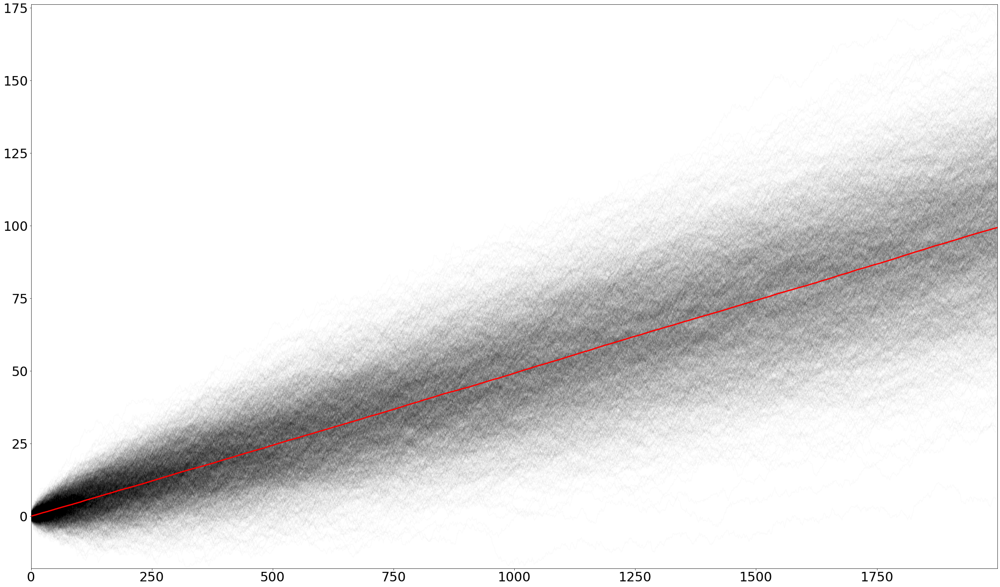

In [11]:
plot_monte_carlo_sim(monte_carlo_sim_df, title="Drew S.", logy=False)

In [15]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005,1,1)
end = datetime.datetime.today()
data_dict={}

stocks = "MSFT", "AAPL", "IBM", "DE"

for stock in stocks:
    # data_dict[stock] = web.DataReader(stock, "yahoo", start, end)
    # alternate
    data_dict[stock] = web.DataReader(stock, "yahoo", start, end)
    
    #["Close"]
    


In [16]:
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}

In [17]:
close_data_dict

{'MSFT': Date
 2005-01-03     26.740000
 2005-01-04     26.840000
 2005-01-05     26.780001
 2005-01-06     26.750000
 2005-01-07     26.670000
                  ...    
 2021-11-26    329.679993
 2021-11-29    336.630005
 2021-11-30    330.589996
 2021-12-01    330.079987
 2021-12-02    330.279999
 Name: Close, Length: 4260, dtype: float64,
 'AAPL': Date
 2005-01-03      1.130179
 2005-01-04      1.141786
 2005-01-05      1.151786
 2005-01-06      1.152679
 2005-01-07      1.236607
                  ...    
 2021-11-26    156.809998
 2021-11-29    160.240005
 2021-11-30    165.300003
 2021-12-01    164.770004
 2021-12-02    161.761002
 Name: Close, Length: 4260, dtype: float64,
 'IBM': Date
 2005-01-03     93.451241
 2005-01-04     92.447418
 2005-01-05     92.256210
 2005-01-06     91.969406
 2005-01-07     91.567879
                  ...    
 2021-11-26    115.809998
 2021-11-29    118.500000
 2021-11-30    117.099998
 2021-12-01    116.919998
 2021-12-02    117.589996
 Name: Close,

In [18]:
close_data_df = pd.DataFrame(close_data_dict)
close_data_df

,MSFT,AAPL,IBM,DE
Date,,,,
2005-01-03,26.740000,1.130179,93.451241,36.470001
2005-01-04,26.840000,1.141786,92.447418,35.599998
2005-01-05,26.780001,1.151786,92.256210,35.255001
2005-01-06,26.750000,1.152679,91.969406,35.744999
2005-01-07,26.670000,1.236607,91.567879,35.250000
...,...,...,...,...
2021-11-26,329.679993,156.809998,115.809998,359.299988
2021-11-29,336.630005,160.240005,118.500000,348.089996
2021-11-30,330.589996,165.300003,117.099998,345.540009


In [19]:
cd_pct_chg_df = close_data_df.pct_change()
cd_pct_chg_df

,MSFT,AAPL,IBM,DE
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.023855
2005-01-05,-0.002235,0.008758,-0.002068,-0.009691
2005-01-06,-0.001120,0.000775,-0.003109,0.013899
2005-01-07,-0.002991,0.072811,-0.004366,-0.013848
...,...,...,...,...
2021-11-26,-0.024356,-0.031678,-0.007881,-0.023270
2021-11-29,0.021081,0.021874,0.023228,-0.031200
2021-11-30,-0.017943,0.031578,-0.011814,-0.007326


In [20]:
# Adding 1 to each value becasue we want toe use a cumulative sum so today * 1.045% will give you the next days value.
close_data_normalized = cd_pct_chg_df.add(1).cumprod()
close_data_normalized.fillna(1,inplace=True)
close_data_normalized

,MSFT,AAPL,IBM,DE
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.976145
2005-01-05,1.001496,1.019118,0.987212,0.966685
2005-01-06,1.000374,1.019908,0.984143,0.980121
2005-01-07,0.997382,1.094169,0.979847,0.966548
...,...,...,...,...
2021-11-26,12.329095,138.747925,1.239256,9.851932
2021-11-29,12.589006,141.782849,1.268041,9.544557
2021-11-30,12.363126,146.260014,1.253060,9.474637


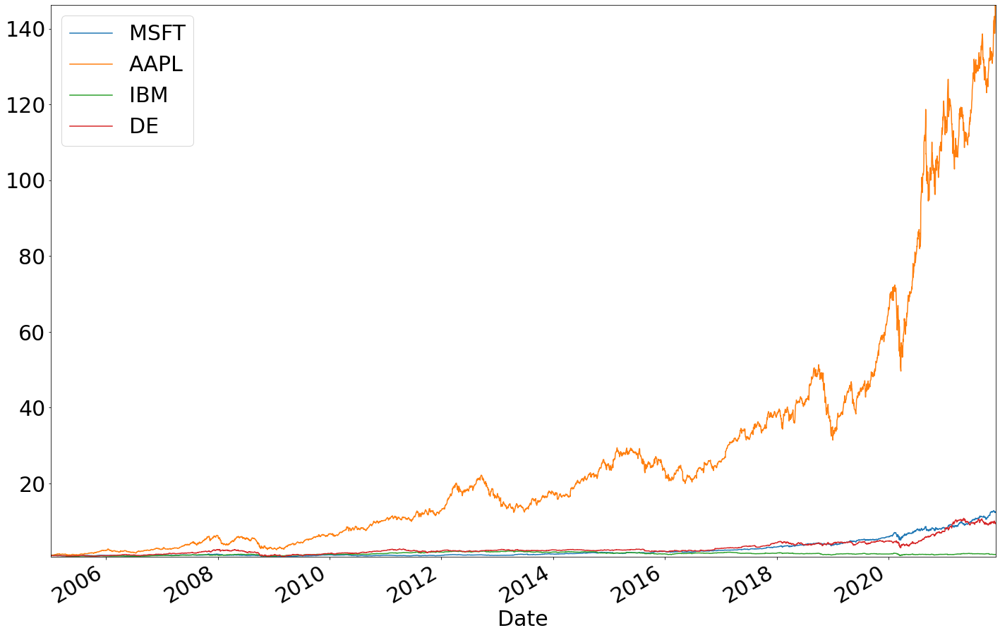

In [21]:
fig, ax = plt.subplots(figsize=(24,16))
close_data_normalized.plot.line(ax=ax)
plt.show()
plt.close()

### Daily Rate of Return

Derive the daily rate of return from the present value equation.

>$PV = \frac{FV}{(1 + r)^t}$
>
>Overall rate of return: $R=\frac{FV}{PV}$

Discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

>$ r = (R)^{\frac{1}{t}} - 1$
>
>$t$ is measured in days

In [22]:
FV = close_data_normalized.iloc[-1]
PV = close_data_normalized.iloc[0]
R = FV.div(PV)
t = close_data_normalized["MSFT"].count()


In [23]:
mean_var_df = pd.DataFrame({"mean": R ** (1 / t) - 1,
                            "sigma": cd_pct_chg_df.std()})

mean_var_df

,mean,sigma
MSFT,0.000590,0.017055
AAPL,0.001166,0.020771
IBM,0.000054,0.014585
DE,0.000532,0.020847


In [24]:


mean_var_df = pd.DataFrame({"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
                                1 / close_data_normalized["MSFT"].count()) - 1, 
                            "sigma" : cd_pct_chg_df.std()})
mean_var_df

,mean,sigma
MSFT,0.000590,0.017055
AAPL,0.001166,0.020771
IBM,0.000054,0.014585
DE,0.000532,0.020847


In [25]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}

for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]   
    run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict[stock], dates)
#    monte_carlo_sim_dict[stock] = pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()

In [26]:
monte_carlo_sim_dfs = {stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod() for stock in stocks}

In [27]:
monte_carlo_sim_dfs

{'MSFT':                  0         1         2          3         4          5    \
 2005-01-03  1.034877  1.001158  0.995799   0.987106  1.030256   1.008052   
 2005-01-04  1.034890  0.991118  1.024595   0.997069  1.049360   0.991953   
 2005-01-05  1.043871  1.015270  1.025427   0.987520  1.062108   0.964309   
 2005-01-06  1.028501  1.016692  1.043839   0.986105  1.111771   0.948519   
 2005-01-07  1.013827  1.046991  1.026712   0.992573  1.108037   0.916468   
 ...              ...       ...       ...        ...       ...        ...   
 2021-11-26  2.983046  2.999981  1.738469  21.308972  6.113608  24.125514   
 2021-11-29  3.049779  2.980086  1.714746  21.237602  6.147840  24.116345   
 2021-11-30  2.981522  2.871683  1.718120  21.035022  6.273593  24.122451   
 2021-12-01  3.031886  2.917568  1.710648  20.736817  6.369733  24.893998   
 2021-12-02  2.940642  2.947948  1.714457  20.683718  6.367569  25.345565   
 
                  6         7          8         9    ...       49

In [28]:
def plot_monte_carlo_sim(sim_data, observed_data = None, title = None, logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)    
    index = sim_data.index
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop(["mean"], inplace = False, axis = 1).plot.line(
        legend=False, 
        marker =".", 
        markersize = .1, 
        color = "k", 
        alpha = .05, 
        logy = logy, 
        ax = ax)
    if observed_data is not None:
        observed_data.plot.line(legend = False, color = "yellow", linewidth = 5, logy = logy, ax = ax)
        # find x coordinate of lowest value observed
        obs_text_x = observed_data[observed_data == observed_data.min()].index
        plt.text(obs_text_x, 
                 observed_data.loc[obs_text_x] * .7,
                 "Observed", 
                 fontsize = 70, 
                 color = "yellow")
    sim_data["mean"].plot.line(legend = False, 
                               color = "red", 
                               linewidth = 5, 
                               logy = logy, 
                               ax = ax)
    plt.text(index[-400], sim_data["mean"].iloc[-400] * 1.5, "Exp\nVal",
            fontsize = 70, color = "red")
   
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

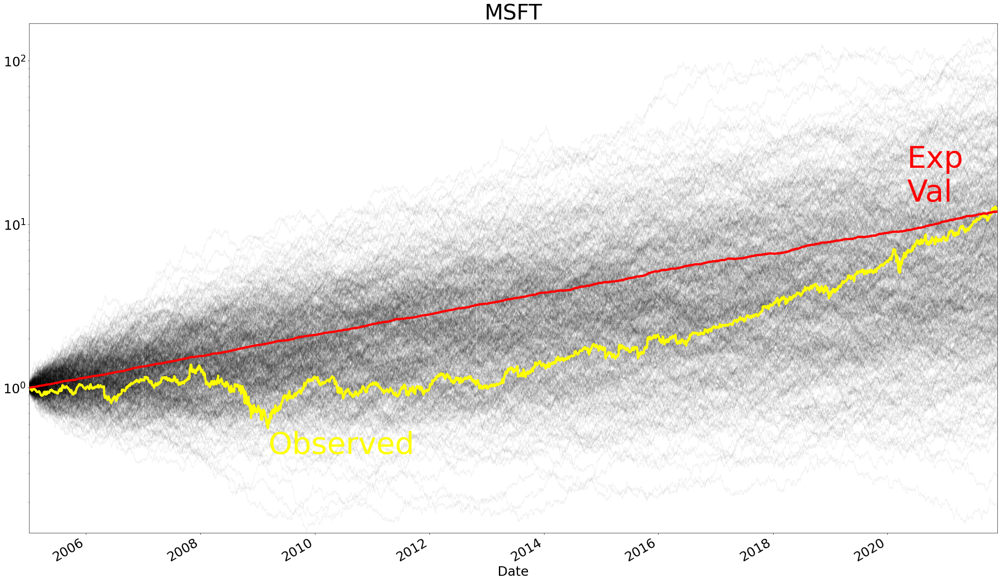

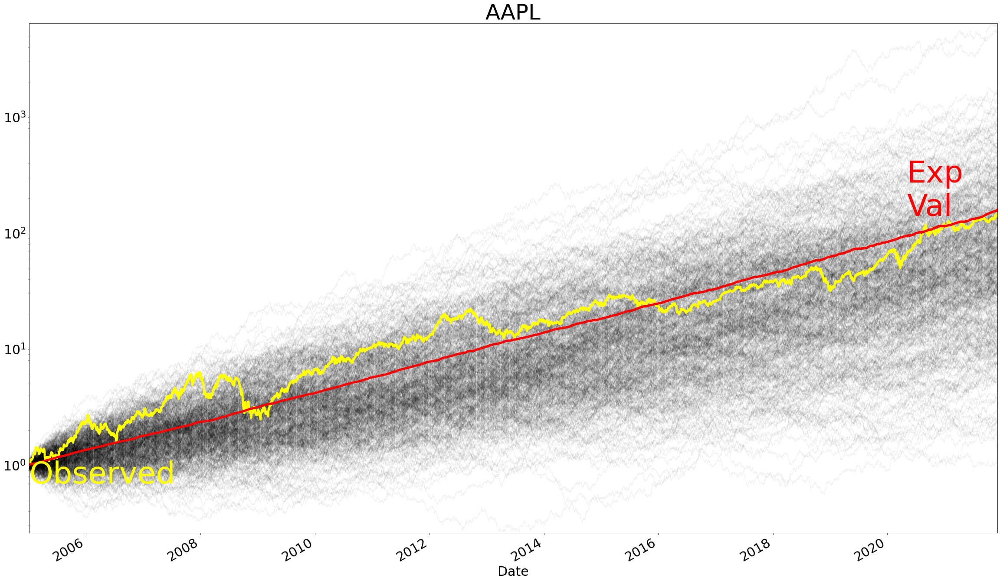

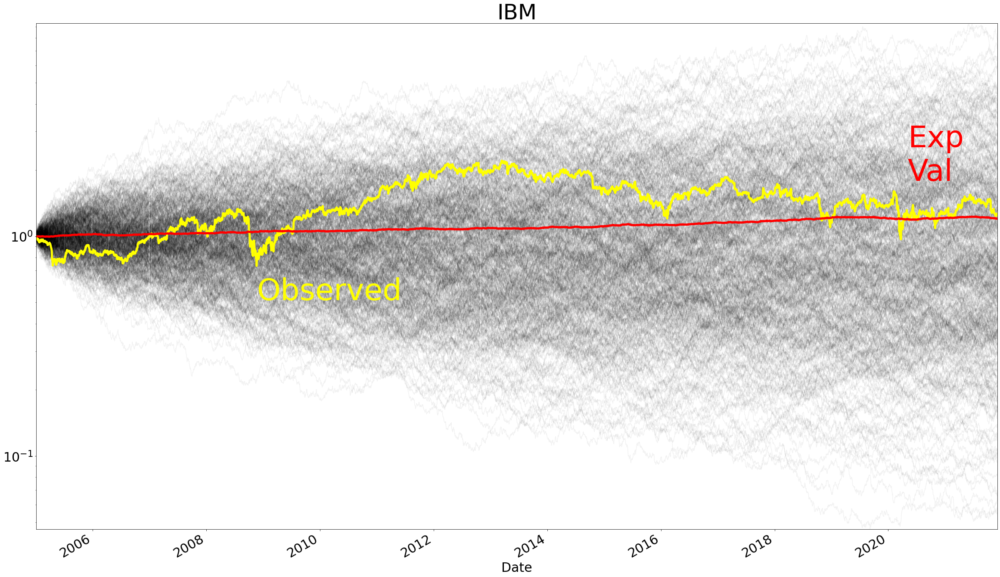

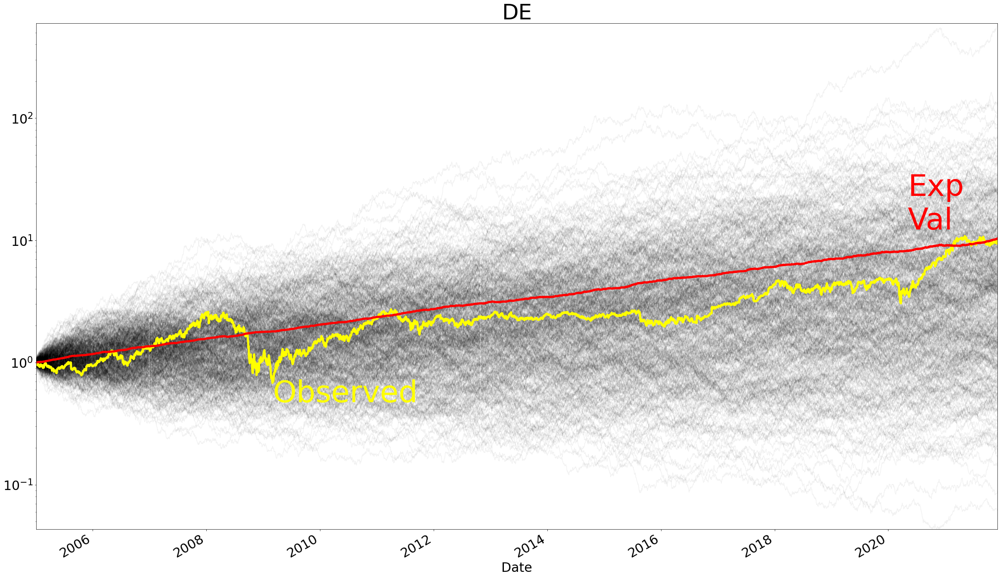

In [29]:
for stock in stocks:
    plot_monte_carlo_sim(monte_carlo_sim_dfs[stock], 
                         close_data_normalized[stock], 
                         stock, 
                         logy= True)

# Calculate Portfolio Return

In [30]:
portfolio_weights = {stock:1 / len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'DE': 0.25}

In [31]:
# This 

ex_return = pd.DataFrame(close_data_normalized.apply(lambda x :x.mul(portfolio_weights[x.name]), axis = 0).sum(axis=1),
                        columns = ["Portfolio Return"])
close_data_normalized["Portfolio Return"] = ex_return
close_data_normalized

,MSFT,AAPL,IBM,DE,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.976145,0.994853
2005-01-05,1.001496,1.019118,0.987212,0.966685,0.993628
2005-01-06,1.000374,1.019908,0.984143,0.980121,0.996137
2005-01-07,0.997382,1.094169,0.979847,0.966548,1.009486
...,...,...,...,...,...
2021-11-26,12.329095,138.747925,1.239256,9.851932,40.542052
2021-11-29,12.589006,141.782849,1.268041,9.544557,41.296113
2021-11-30,12.363126,146.260014,1.253060,9.474637,42.337709


In [33]:
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)
ex_return_pct_change

,Portfolio Return
Date,
2005-01-04,-0.005147
2005-01-05,-0.001232
2005-01-06,0.002525
2005-01-07,0.013402
2005-01-10,-0.001270
...,...
2021-11-26,-0.030440
2021-11-29,0.018599
2021-11-30,0.025223


In [36]:
t = ex_return["Portfolio Return"].count()
PV = ex_return.iloc[0]
FV = ex_return.iloc[-1]
R = FV.div(PV)

In [37]:
mean_var_df = pd.DataFrame({"mean": (ex_return.iloc[-1] / ex_return.iloc[0]) **(1 / ex_return["Portfolio Return"].count()) -1,
                           "sigma" : ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.000875,0.016872


In [40]:
form_mean_var_df = pd.DataFrame({"mean": R ** (1 / t) - 1,
                            "sigma": ex_return_pct_change.std()})


In [41]:
form_mean_var_df

,mean,sigma
Portfolio Return,0.000875,0.016872


In [43]:
sims = 1000
dates = ex_return.index
dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]
run_monte_carlo(mean, sigma, sims, dict, dates)

sim_df = pd.DataFrame(dict).add(1).cumprod()
sim_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
2005-01-03,0.994640,0.993399,1.007191,0.999341,1.027647,1.026886,1.010072,0.963660,0.999137,1.022135,...,1.044593,1.001671,0.997286,0.978272,0.977886,0.989230,1.026303,0.994539,1.025523,1.011615
2005-01-04,1.014179,1.006371,1.004733,1.033170,1.022930,0.995269,1.033711,0.978792,1.023333,0.986991,...,1.076655,1.017478,1.028531,0.986259,0.993179,0.975708,1.048015,1.022216,1.006198,0.989877
2005-01-05,1.027407,1.003702,1.020297,1.041191,1.006928,1.005529,1.035588,0.961139,0.995887,1.011067,...,1.073724,1.021576,1.065607,0.968246,0.991753,0.970508,1.043433,0.997196,1.002872,0.982826
2005-01-06,0.994684,1.014884,1.039190,1.098794,1.038816,0.986605,1.009249,0.925810,1.004710,0.989490,...,1.086217,1.019173,1.038612,1.000326,1.015330,0.966295,1.037813,0.956778,0.996446,1.007868
2005-01-07,1.001570,1.030951,1.030876,1.066446,1.053624,0.994647,0.973563,0.941733,1.017080,0.980723,...,1.092786,1.032104,1.043939,0.984177,1.007308,0.980930,1.051779,0.954522,0.977578,1.038908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-26,16.013492,39.267886,5.283290,19.679687,10.084865,41.828523,12.206860,84.465640,231.105688,17.540099,...,55.143253,260.075589,41.599807,43.475560,107.336061,10.648988,20.456190,11.713838,9.986726,38.868234
2021-11-29,16.253654,40.146929,5.280645,18.978461,10.178655,42.276112,11.890447,84.242246,235.494798,16.937621,...,55.016815,259.676255,41.876484,42.097786,106.016532,10.816986,19.917758,11.638886,10.173255,37.674060
2021-11-30,16.744583,39.483747,5.404678,19.027326,9.850165,42.392992,11.681360,86.139295,231.537237,17.201401,...,55.342615,273.676997,41.019856,42.301097,106.403653,10.840343,19.913623,11.523718,10.292889,38.053863
2021-12-01,16.594504,38.532428,5.452316,19.461628,9.736230,43.261230,11.409523,87.807029,235.093879,17.248992,...,55.384269,269.524338,41.229455,42.335103,104.600576,11.200773,19.548672,11.384357,10.453512,37.692724


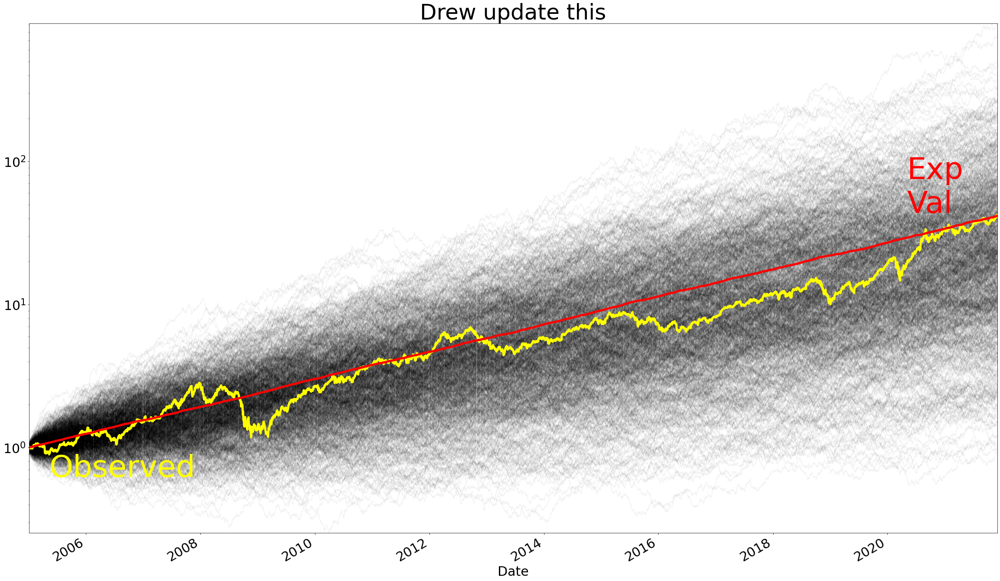

In [46]:
plot_monte_carlo_sim(sim_df, 
                     observed_data = ex_return["Portfolio Return"],
                         title = "Drew update this",
                         logy= True)